# Capstone 2: Midterm Project

# Importing all the necessary modules

In [1]:

import pandas as pd
pd.options.display.max_rows = 12000
import numpy as np
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

from datetime import datetime

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer
from category_encoders import TargetEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import RandomOverSampler

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import classification_report

# Data Preparation

In [2]:
# Using the csv file to load the dataset 
data = pd.read_csv(r'C:\Users\Jay\Desktop\Python DS\CitiBike_Trip_Data\2021\January2021.csv')

# Creating a dataframe
df = pd.DataFrame(data)
df

,tripduration,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,end station longitude,bikeid,usertype,birth year,gender
0,266,2021-01-01 00:03:35.5100,2021-01-01 00:08:01.7770,3273,Manila & 1st,40.721651,-74.042884,3209,Brunswick St,40.724176,-74.050656,42494,Subscriber,1988,1
1,1543,2021-01-01 00:23:32.9250,2021-01-01 00:49:16.0830,3681,Grand St,40.715178,-74.037683,3213,Van Vorst Park,40.718489,-74.047727,45343,Customer,1996,2
2,1461,2021-01-01 00:23:50.7940,2021-01-01 00:48:12.5660,3681,Grand St,40.715178,-74.037683,3213,Van Vorst Park,40.718489,-74.047727,31794,Customer,1995,1
3,793,2021-01-01 00:31:09.0770,2021-01-01 00:44:22.9430,3185,City Hall,40.717732,-74.043845,3199,Newport Pkwy,40.728745,-74.032108,42316,Customer,1969,0
4,596,2021-01-01 00:35:52.1900,2021-01-01 00:45:48.7740,3639,Harborside,40.719252,-74.034234,3209,Brunswick St,40.724176,-74.050656,32575,Customer,1969,0
5,144,2021-01-01 00:39:55.5950,2021-01-01 00:42:19.7750,3269,Brunswick & 6th,40.726012,-74.050389,3211,Newark Ave,40.721525,-74.046305,48913,Subscriber,1990,1
6,610,2021-01-01 00:43:49.4060,2021-01-01 00:53:59.5240,3198,Heights Elevator,40.748716,-74.040443,3206,Hilltop,40.731169,-74.057574,33652,Customer,1969,0
7,265,2021-01-01 01:12:20.8060,2021-01-01 01:16:46.3990,3276,Marin Light Rail,40.714584,-74.042817,3214,Essex Light Rail,40.712774,-74.036486,41620,Subscriber,1958,1
8,353,2021-01-01 01:14:02.8890,2021-01-01 01:19:56.3990,3185,City Hall,40.717732,-74.043845,3192,Liberty Light Rail,40.711242,-74.055701,40709,Subscriber,1974,1
9,269,2021-01-01 01:17:06.6420,2021-01-01 01:21:35.7940,3195,Sip Ave,40.730897,-74.063913,3225,Baldwin at Montgomery,40.723659,-74.064194,41992,Customer,1969,0


In [3]:
# Checking the datatypes of each column of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11624 entries, 0 to 11623
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   tripduration             11624 non-null  int64  
 1   starttime                11624 non-null  object 
 2   stoptime                 11624 non-null  object 
 3   start station id         11624 non-null  int64  
 4   start station name       11624 non-null  object 
 5   start station latitude   11624 non-null  float64
 6   start station longitude  11624 non-null  float64
 7   end station id           11624 non-null  int64  
 8   end station name         11624 non-null  object 
 9   end station latitude     11624 non-null  float64
 10  end station longitude    11624 non-null  float64
 11  bikeid                   11624 non-null  int64  
 12  usertype                 11624 non-null  object 
 13  birth year               11624 non-null  int64  
 14  gender                

In [3]:
# Dropping all the duplicate rows in dataframe
df = df.drop_duplicates()


In [4]:
# checking for the null values in each column of the dataframe
df.isnull().sum()

tripduration               0
starttime                  0
stoptime                   0
start station id           0
start station name         0
start station latitude     0
start station longitude    0
end station id             0
end station name           0
end station latitude       0
end station longitude      0
bikeid                     0
usertype                   0
birth year                 0
gender                     0
dtype: int64

In [5]:
# Describing the statistics of each column
df.describe()

,tripduration,start station id,start station latitude,start station longitude,end station id,end station latitude,end station longitude,bikeid,birth year,gender
count,11624.000000,11624.000000,11624.000000,11624.000000,11624.000000,11624.000000,11624.000000,11624.000000,11624.000000,11624.000000
mean,985.140571,3299.824673,40.722745,-74.047279,3298.063575,40.722357,-74.046722,41836.669219,1980.838696,1.120871
std,9907.868836,177.102119,0.007203,0.011707,178.562559,0.007211,0.011574,5154.081529,11.461724,0.560016
min,61.000000,3184.000000,40.711130,-74.083639,514.000000,40.711130,-74.083639,19209.000000,1946.000000,0.000000
25%,271.000000,3195.000000,40.717732,-74.051789,3195.000000,40.717732,-74.050656,41547.000000,1969.000000,1.000000
50%,443.500000,3210.000000,40.721630,-74.044247,3210.000000,40.721525,-74.043845,42574.000000,1984.000000,1.000000
75%,797.000000,3276.000000,40.727224,-74.038051,3276.000000,40.727224,-74.038051,44872.000000,1990.000000,1.000000
max,760684.000000,3792.000000,40.748716,-74.032108,4069.000000,40.848282,-73.941343,49985.000000,2003.000000,2.000000


In [5]:
# Converting the columns: starttime and stoptime into datetime datatype
df['starttime'] = df['starttime'].apply(lambda x :  datetime.strptime(x, '%Y-%m-%d %H:%M:%S.%f'))
df['stoptime'] = df['stoptime'].apply(lambda x :  datetime.strptime(x, '%Y-%m-%d %H:%M:%S.%f'))

In [6]:
# Create a new column for duration of the trip in seconds by subtracting the columns: stoptime and starttime  
df['duration']= (df['stoptime']-df['starttime']).dt.total_seconds()

In [7]:
# Creating new columns: start_hour and stop_hour for getting the hour of the day from the 
#columns: starttime and stoptime for effective prediction of the label 
df['start_hour']=df['starttime'].dt.hour
df['stop_hour']=df['stoptime'].dt.hour

Duration column turns out to be the same as the existing column tripduration by default in the dataset

In [8]:
# A new dataframe was created for extracting values for the birth year between 1985 and 1995
year = df[(df['birth year']<= 1995) & (df['birth year']>=1985)]

In [9]:
# Changing the datatypes of the necessary columns into categorical
year['birth year'] = year['birth year'].astype('category') 
df['start station name'] = df['start station name'].astype('category')
df['start station latitude'] = df['start station latitude'].astype('category')
df['start station longitude'] = df['start station longitude'].astype('category')
df['end station id'] = df['end station id'].astype('category')
df['bikeid'] = df['bikeid'].astype('category') 
df['start station name'] = df['start station name'].astype('category')
df['end station latitude'] = df['end station latitude'].astype('category')
df['end station longitude'] = df['end station longitude'].astype('category')
df['birth year'] = df['birth year'].astype('category')
df['gender'] = df['gender'].astype('category')
df['start_hour'] = df['start_hour'].astype('category')
df['stop_hour'] = df['stop_hour'].astype('category')




C:\Users\Jay\AppData\Local\Temp\ipykernel_9300\2722092653.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  year['birth year'] = year['birth year'].astype('category')


# EDA

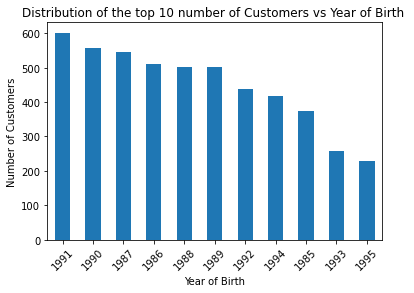

In [10]:
# Creating a bar chart to show the distribution of the top 10 number of customers vs year of Birth
year['birth year'].value_counts().plot(kind='bar')
plt.xlabel('Year of Birth')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.title('Distribution of the top 10 number of Customers vs Year of Birth ');

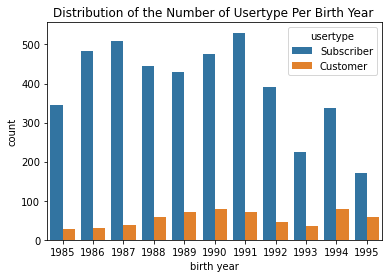

In [11]:
# Creating a bar chart to show the distribution of the number of usertype per birth year 
sns.countplot(data=year,x='birth year',hue='usertype').set(title='Distribution of the Number of Usertype Per Birth Year ');

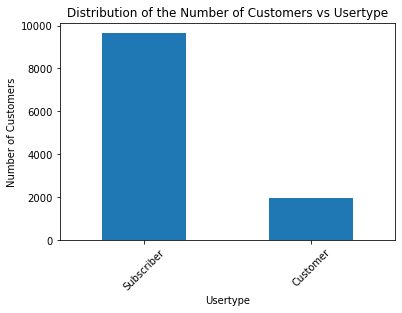

In [12]:
# Creating a bar chart to show the imbalance data distribution between the two kinds of Usertype
df['usertype'].value_counts(normalize=False).plot(kind='bar')
plt.xlabel('Usertype')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.title('Distribution of the Number of Customers vs Usertype');

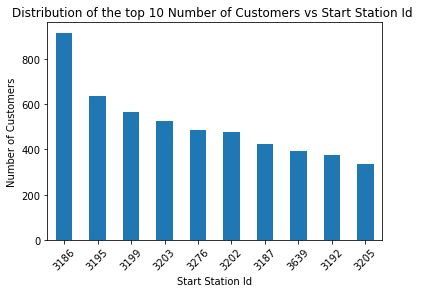

In [13]:
# Creating a bar chart to show the distribution of the top 10 number of customers vs Start Station Id
df['start station id'].value_counts(normalize=False).head(10).plot(kind='bar')
plt.xlabel('Start Station Id')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.title('Distribution of the top 10 Number of Customers vs Start Station Id ');

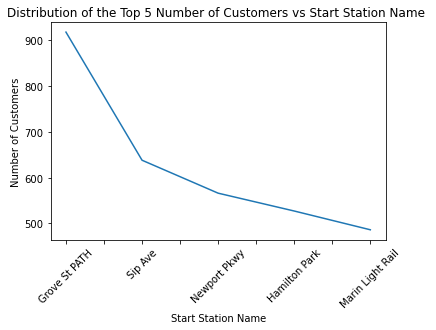

In [14]:
# Creating a line graph to show the distribution of the top 5 number of cutomers vs Start station Name
df['start station name'].value_counts(normalize=False).head(5).plot(kind='line')
plt.xlabel('Start Station Name')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.title('Distribution of the Top 5 Number of Customers vs Start Station Name ');

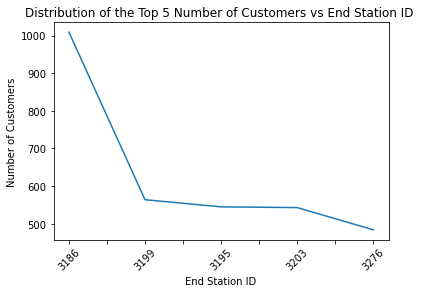

In [15]:
# Creating a line graph to show the distribution of the top 5 number of customers vs End Station ID
df['end station id'].value_counts(normalize=False).head(5).plot(kind='line')
plt.xlabel('End Station ID')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.title('Distribution of the Top 5 Number of Customers vs End Station ID ');

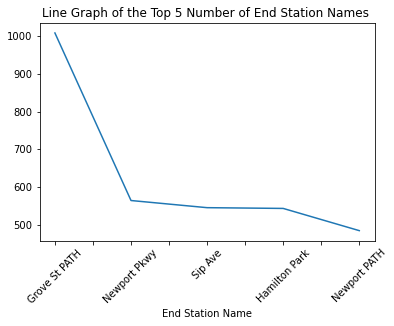

In [16]:
# Creating a line graph to show the top 5 number of End station names
df['end station name'].value_counts(normalize=False).head(5).plot(kind='line')
plt.xlabel('End Station Name')
plt.xticks(rotation=45)
plt.title('Line Graph of the Top 5 Number of End Station Names ');

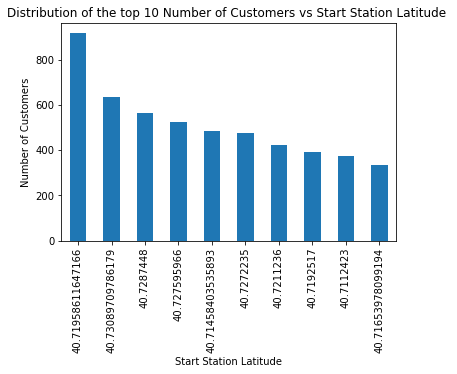

In [17]:
# Bar chart of the distribution of the top 10 number of customers vs Start Station Latitude
df['start station latitude'].value_counts(normalize=False).head(10).plot(kind='bar')
plt.xlabel('Start Station Latitude')
plt.ylabel('Number of Customers')
plt.title('Distribution of the top 10 Number of Customers vs Start Station Latitude ');

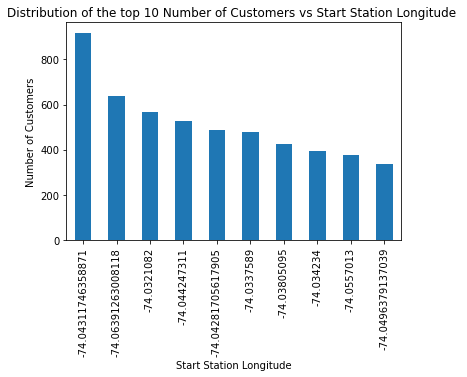

In [18]:
# Bar chart of the distribution of the top 10 number of customers vs Start Station Longitude 
df['start station longitude'].value_counts(normalize=False).head(10).plot(kind='bar')
plt.xlabel('Start Station Longitude')
plt.ylabel('Number of Customers')
plt.title('Distribution of the top 10 Number of Customers vs Start Station Longitude ');

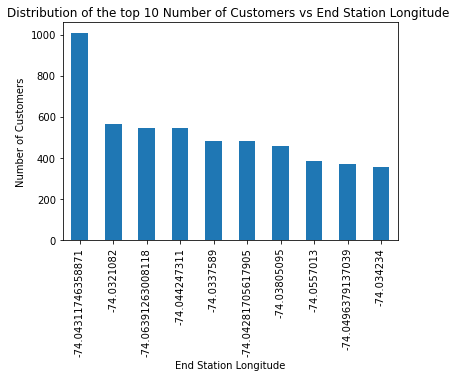

In [19]:
# Bar chart of the distribution of the top 10 number of customers vs End Station Longitude
df['end station longitude'].value_counts(normalize=False).head(10).plot(kind='bar')
plt.xlabel('End Station Longitude')
plt.ylabel('Number of Customers')
plt.title('Distribution of the top 10 Number of Customers vs End Station Longitude ');

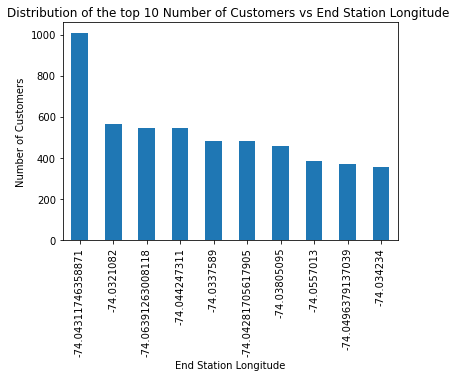

In [20]:
# Bar chart of the distribution of the top 10 number of customers vs End Station Longitude
df['end station longitude'].value_counts(normalize=False).head(10).plot(kind='bar')
plt.xlabel('End Station Longitude')
plt.ylabel('Number of Customers')
plt.title('Distribution of the top 10 Number of Customers vs End Station Longitude ');

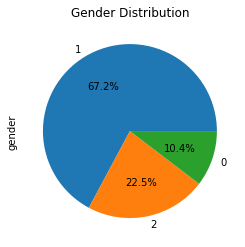

In [21]:
# Bar chart of the distribution of the number of customers vs Start Station Latitude
df['gender'].value_counts().plot(kind='pie',labels=df['gender'].unique(),legend=False, autopct= '%1.1f%%')
plt.title('Gender Distribution');

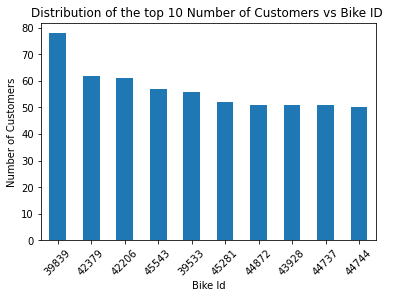

In [22]:
# Bar chart of the distribution of the top 10 number of customers vs Bike ID 
df['bikeid'].value_counts(normalize=False).head(10).plot(kind='bar')
plt.xlabel('Bike Id')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.title('Distribution of the top 10 Number of Customers vs Bike ID ');

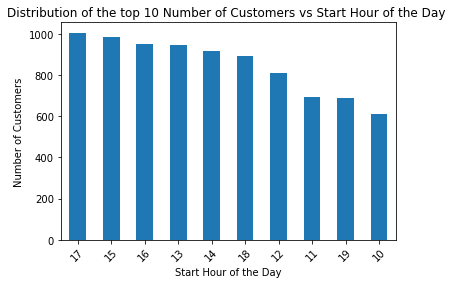

In [23]:
# Bar chart of the distribution of the top 10 number of customers vs Start Hour of the Day 
df['start_hour'].value_counts(normalize=False).head(10).plot(kind='bar')
plt.xlabel('Start Hour of the Day')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.title('Distribution of the top 10 Number of Customers vs Start Hour of the Day ');

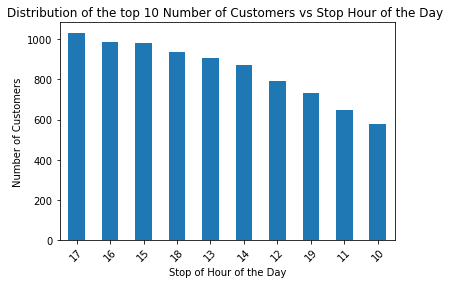

In [24]:
# Bar chart of the distribution of the top 10 number of customers vs Stop Hour of the Day 
df['stop_hour'].value_counts(normalize=False).head(10).plot(kind='bar')
plt.xlabel('Stop of Hour of the Day')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.title('Distribution of the top 10 Number of Customers vs Stop Hour of the Day ');

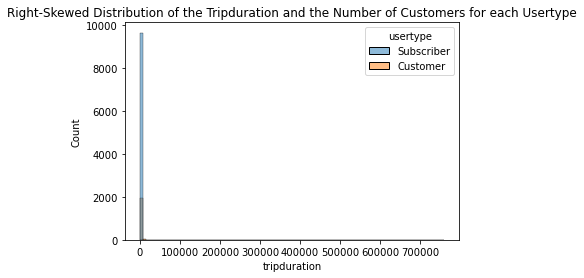

In [25]:
# A histogram to show the right-skewed distribution of the Trip duration and the number of customers in each usertype
sns.histplot(data=df,x='tripduration',hue='usertype',bins=100).set(title='Right-Skewed Distribution of the Tripduration and the Number of Customers for each Usertype');

In [26]:
# Creating a new column to transform the right skewed distribution to a normal distribution using log
df['log-tripduration'] = np.log1p(df['tripduration'])

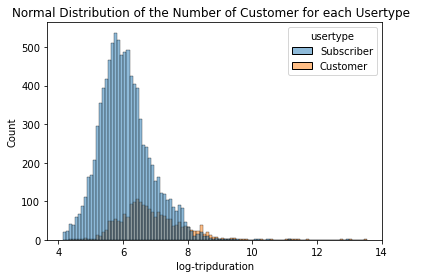

In [27]:
# A normal distribution of the number of customers for each usertype
sns.histplot(data=df,x='log-tripduration',hue='usertype',bins=100).set(title='Normal Distribution of the Number of Customer for each Usertype  ');

## Outlier Detection

C:\Users\Jay\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


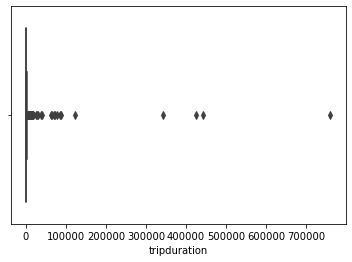

In [28]:
#Plotting a boxplot on the 'tripduration' column
sns.boxplot(data['tripduration'])

#Calculating the 1st Quartile and the 3rd Quartile of the 'tripduration' column
Q1 = data['tripduration'].quantile(0.25)
Q3 = data['tripduration'].quantile(0.75)

#Calculating the Inter-quartile range
IQR = Q3 - Q1

#Finding the Lower Fence and the Upper Fence
Lower_fence = Q1 - (1.5 * IQR)
Upper_fence = Q3 + (1.5 * IQR)


Tripduration is numeric and there is no null value in it and it has right-skewed distribution
and when we appply the logarthim it changes to normal disturbtion with outliers and deal with it in the column transfermer to avoid data leakage

In [29]:
# Checking if all the columns have the desired datatype
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11624 entries, 0 to 11623
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   tripduration             11624 non-null  int64         
 1   starttime                11624 non-null  datetime64[ns]
 2   stoptime                 11624 non-null  datetime64[ns]
 3   start station id         11624 non-null  int64         
 4   start station name       11624 non-null  category      
 5   start station latitude   11624 non-null  category      
 6   start station longitude  11624 non-null  category      
 7   end station id           11624 non-null  category      
 8   end station name         11624 non-null  object        
 9   end station latitude     11624 non-null  category      
 10  end station longitude    11624 non-null  category      
 11  bikeid                   11624 non-null  category      
 12  usertype                 11624 n

## Feature Selection

In [30]:
# Dividing the dataframe into features and labels by dropping the unnecessary columns
X = df.drop(['start station id','starttime','stoptime','start station longitude','end station id',\
              'end station longitude','bikeid','duration','usertype','log-tripduration'], axis=1)
y = df['usertype']

In [31]:
# Shape of features dataframe
X.shape

(11624, 9)

In [32]:
# Shape of the label dataframe
y.shape

(11624,)

# Splitting

In [33]:
# Splitting the dataset into training dataset and testing dataset in the proportion 7:3, respectively
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,stratify=y,random_state=42)

In [34]:
# Shape of the x train dataset
X_train.shape

(8136, 9)

In [35]:
# Shape of the x test dataset
X_test.shape

(3488, 9)

In [36]:
# Shape of the y train dataset
y_train.shape

(8136,)

In [37]:
# Shape of the y test dataset
y_test.shape

(3488,)

In [38]:
# encoding our label to use it in the machine learning model
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_test_enc = le.transform(y_test)

# Preproccessing 

In [39]:
# Classifying the features into categorical features and numerical features
cat_feature = [ 'start station name', 'start station latitude',
       'end station name', 'end station latitude', 'birth year', 'gender',
       'start_hour', 'stop_hour' ]
num_feature = ['tripduration']

In [40]:
#!pip install category_encoders

# Define a custom function for outlier handling
def handle_outliers(x):
    # Detect outliers using a specific method, e.g. IQR
    Q1 = np.percentile(x, 25)
    Q3 = np.percentile(x, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Replace outliers with a specific value or perform another handling method
    x[(x < lower_bound) | (x > upper_bound)] = np.median(x)  # Example: replace outliers with median
    return x

In [41]:
# Creating a pipeline for encoding categorical values
cat_pipeline = Pipeline([
    ('te',TargetEncoder())
])

# Creating a pipeline for handling the outliers and transforming numerical values into log form for better visualization 
num_pipeline = Pipeline([
    ('ot',FunctionTransformer(func = handle_outliers)),
    ('rs',FunctionTransformer(func = np.log1p) )
])

# Using the ColumnTransformer to simultaneosuly run both categorical and numerical pipeline in the preprocessor
preprocessor = ColumnTransformer([
    ('cat',TargetEncoder(),cat_feature),
    ('num',num_pipeline,num_feature)
],remainder='passthrough')


In [42]:
# Visualization of whats happening within the preprocessor
preprocessor

ColumnTransformer(remainder='passthrough',
                  transformers=[('cat', TargetEncoder(),
                                 ['start station name',
                                  'start station latitude', 'end station name',
                                  'end station latitude', 'birth year',
                                  'gender', 'start_hour', 'stop_hour']),
                                ('num',
                                 Pipeline(steps=[('ot',
                                                  FunctionTransformer(func=<function handle_outliers at 0x000001FB523B5700>)),
                                                 ('rs',
                                                  FunctionTransformer(func=<ufunc 'log1p'>))]),
                                 ['tripduration'])])

# Baseline model:

### LogisticReg

In [43]:
# Creating a pipeline to simultaneosuly apply ColumnTransformer, RandomOverSampler, and LogisticRegression   
lr_pipe = Pipeline([
    ('pre',preprocessor),
    ('ros',RandomOverSampler()),
    ('lr',LogisticRegression())
])

In [29]:
# Visualization of whats happening within the logisticRegression pipeline
lr_pipe

Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('cat',
                                                  Pipeline(steps=[('te',
                                                                   TargetEncoder())]),
                                                  ['start station name',
                                                   'start station latitude',
                                                   'end station name',
                                                   'end station latitude',
                                                   'birth year', 'gender',
                                                   'start_hour', 'stop_hour']),
                                                 ('num',
                                                  Pipeline(steps=[('ot',
                                                                   FunctionTransformer(func=<function handle_outliers at 0x000002A066DA1820>)),
                                                                  ('rs',
                                                                   FunctionTransformer(func=<ufunc 'log1p'>))]),
                                                  ['tripduration'])])),
                ('ros', RandomOverSampler()),
                ('lr', LogisticRegression(C=0.01))])

In [44]:
# split the data into testing and training set
lr_pipe.fit(X_train,y_train_enc)
y_ped = lr_pipe.predict(X_test)

# Printing the classification report to show accuracy level of the prediction
print(classification_report(y_test_enc,y_ped))

              precision    recall  f1-score   support

           0       0.58      0.68      0.63       593
           1       0.93      0.90      0.92      2895

    accuracy                           0.86      3488
   macro avg       0.76      0.79      0.77      3488
weighted avg       0.87      0.86      0.87      3488



### DecisionTree


In [45]:
# Creating a pipeline to simultaneosuly apply ColumnTransformer, RandomOverSampler, and DecisionTreeClassifier   
dt_pipe = Pipeline([
    ('pre',preprocessor),
    ('ros',RandomOverSampler()),
    ('dtc',DecisionTreeClassifier())
])

In [46]:
# split the data into testing and training set
dt_pipe.fit(X_train,y_train_enc)
y_ped = dt_pipe.predict(X_test)

# Printing the classification report to show accuracy level of the prediction
print(classification_report(y_test_enc,y_ped))

              precision    recall  f1-score   support

           0       0.72      0.63      0.67       593
           1       0.93      0.95      0.94      2895

    accuracy                           0.90      3488
   macro avg       0.82      0.79      0.80      3488
weighted avg       0.89      0.90      0.89      3488



## xgboost

In [1]:
# Installing xgboost
!pip install xgboost

In [48]:
# Creating a pipeline to simultaneosuly apply ColumnTransformer, RandomOverSampler, and XGBClassifier   
xgb_pipe = Pipeline([
    ('pre',preprocessor),
    ('ros',RandomOverSampler()),
    ('xgb',XGBClassifier())
])

In [49]:
# split the data into testing and training set
xgb_pipe.fit(X_train,y_train_enc)
y_ped = xgb_pipe.predict(X_test)

# Printing the classification report to show accuracy level of the prediction
print(classification_report(y_test_enc,y_ped))

              precision    recall  f1-score   support

           0       0.78      0.67      0.72       593
           1       0.93      0.96      0.95      2895

    accuracy                           0.91      3488
   macro avg       0.86      0.81      0.83      3488
weighted avg       0.91      0.91      0.91      3488



## RandomForest

In [50]:
# Creating a pipeline to simultaneosuly apply ColumnTransformer, RandomOverSampler, and RandomForestClassifier 
rfc_pipe = Pipeline([
    ('pre',preprocessor),
    ('ros',RandomOverSampler()),
    ('rfc',RandomForestClassifier())
])

In [51]:
# split the data into testing and training set
rfc_pipe.fit(X_train,y_train_enc)
y_ped = rfc_pipe.predict(X_test)

# Printing the classification report to show accuracy level of the prediction
print(classification_report(y_test_enc,y_ped))

              precision    recall  f1-score   support

           0       0.88      0.63      0.74       593
           1       0.93      0.98      0.95      2895

    accuracy                           0.92      3488
   macro avg       0.90      0.81      0.85      3488
weighted avg       0.92      0.92      0.92      3488



## Hyperparameter Tuning for Random Forest

In [52]:
# Creating a pipeline to simultaneosuly apply ColumnTransformer, RandomOverSampler, and RandomForestClassifier 
rfc_pipe = Pipeline([
    ('pre',preprocessor),
    ('ros',RandomOverSampler()),
    ('rfc',RandomForestClassifier())
])



In [53]:
# Initiating and assigning values to the parameters for tuning purposes
params = { 
    'rfc__n_estimators': [50,100,150],
    'rfc__max_depth':[5,10,15]
    
}

# Assigning all the required parameters, number of folds, scoring, and error_score 
gd = GridSearchCV(rfc_pipe,params,cv=5,scoring='accuracy',error_score='raise')



In [54]:
# Fitting the X_train and y_train_enc into the grid search
gd.fit(X_train,y_train_enc)

GridSearchCV(cv=5, error_score='raise',
             estimator=Pipeline(steps=[('pre',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('cat',
                                                                         TargetEncoder(),
                                                                         ['start '
                                                                          'station '
                                                                          'name',
                                                                          'start '
                                                                          'station '
                                                                          'latitude',
                                                                          'end '
                                                                          'station '
                                                                          'name',
                                                                          'end '
                                                                          'station '
                                                                          'latitude',
                                                                          'birth '
                                                                          'year',
                                                                          'gender',
                                                                          'start_hour',
                                                                          'stop_hour']),
                                                                        ('num',
                                                                         Pipeline(steps=[('ot',
                                                                                          FunctionTransformer(func=<function handle_outliers at 0x000001FB523B5700>)),
                                                                                         ('rs',
                                                                                          FunctionTransformer(func=<ufunc 'log1p'>))]),
                                                                         ['tripduration'])])),
                                       ('ros', RandomOverSampler()),
                                       ('rfc', RandomForestClassifier())]),
             param_grid={'rfc__max_depth': [5, 10, 15],
                         'rfc__n_estimators': [50, 100, 150]},
             scoring='accuracy')

In [55]:
# Getting the best values of the parameters
gd.best_params_

{'rfc__max_depth': 15, 'rfc__n_estimators': 150}

In [56]:
# Prediction using the determined best parameters on X_test 
y_rd = gd.best_estimator_.predict(X_test)

In [57]:
# Printing the classification report to show accuracy level of the prediction
print(classification_report(y_test_enc,y_rd))

              precision    recall  f1-score   support

           0       0.85      0.69      0.76       593
           1       0.94      0.98      0.96      2895

    accuracy                           0.93      3488
   macro avg       0.90      0.83      0.86      3488
weighted avg       0.92      0.93      0.92      3488

